<a href="https://colab.research.google.com/github/Kriti-2180/Deep-Learning/blob/main/mobilenetv3large.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
import os

zip_path = "/content/drive/MyDrive/cassava_plnt_disease_roboflow.zip"

print(os.path.exists(zip_path))

True


In [4]:
import zipfile
import os

zip_path = "/content/drive/MyDrive/cassava_plnt_disease_roboflow.zip"
extract_path = "/content/"

os.makedirs(extract_path, exist_ok=True)

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

print("Extraction complete!")

Extraction complete!


In [5]:
import os
import json
import pandas as pd

# Main dataset folder
DATASET_DIR = "/content/cassava_plnt_disease_roboflow"

# Split folders
splits = ["train", "valid", "test"]

# Image extensions
image_exts = (".jpg", ".jpeg", ".png", ".bmp", ".webp")

In [6]:
train_dir = os.path.join(DATASET_DIR, "train")

class_names = sorted([
    d for d in os.listdir(train_dir)
    if os.path.isdir(os.path.join(train_dir, d))
])

print("Classes found:")
for i, cls in enumerate(class_names):
    print(i, cls)

Classes found:
0 Cassava___bacterial_blight
1 Cassava___brown_streak_disease
2 Cassava___green_mottle
3 Cassava___healthy
4 Cassava___mosaic_disease


In [7]:
label_num_disease = {
    str(i): class_name for i, class_name in enumerate(class_names)
}

disease_label_num = {
    class_name: i for i, class_name in enumerate(class_names)
}

In [8]:
json_path = os.path.join(DATASET_DIR, "label_num_disease.json")

with open(json_path, "w") as f:
    json.dump(label_num_disease, f, indent=4)

print(f"\nSaved: {json_path}")


Saved: /content/cassava_plnt_disease_roboflow/label_num_disease.json


In [9]:
def create_split_csv(split_name):
    split_dir = os.path.join(DATASET_DIR, split_name)
    rows = []

    for class_name in class_names:
        class_dir = os.path.join(split_dir, class_name)

        if not os.path.exists(class_dir):
            print(f"Warning: {class_dir} not found")
            continue

        for img_name in os.listdir(class_dir):
            if img_name.lower().endswith(image_exts):
                img_path = os.path.join(split_name, class_name, img_name)

                rows.append({
                    "image_path": img_path,
                    "disease": class_name,
                    "label": disease_label_num[class_name]
                })

    df = pd.DataFrame(rows)

    csv_path = os.path.join(DATASET_DIR, f"{split_name}.csv")
    df.to_csv(csv_path, index=False)

    print(f"Saved: {csv_path} | Images: {len(df)}")

    return df

In [10]:
train_df = create_split_csv("train")
valid_df = create_split_csv("valid")
test_df = create_split_csv("test")

Saved: /content/cassava_plnt_disease_roboflow/train.csv | Images: 12546
Saved: /content/cassava_plnt_disease_roboflow/valid.csv | Images: 1448
Saved: /content/cassava_plnt_disease_roboflow/test.csv | Images: 1930


In [11]:
print("\nTrain CSV preview:")
display(train_df.head())

print("\nFiles now inside dataset folder:")
print(os.listdir(DATASET_DIR))


Train CSV preview:


,image_path,disease,label
0,train/Cassava___bacterial_blight/1542749471_jp...,Cassava___bacterial_blight,0
1,train/Cassava___bacterial_blight/2953205129_jp...,Cassava___bacterial_blight,0
2,train/Cassava___bacterial_blight/1018973237_jp...,Cassava___bacterial_blight,0
3,train/Cassava___bacterial_blight/3370458852_jp...,Cassava___bacterial_blight,0
4,train/Cassava___bacterial_blight/2157322964_jp...,Cassava___bacterial_blight,0



Files now inside dataset folder:
['README.roboflow.txt', 'test', 'valid', 'label_num_disease.json', 'train', 'README.dataset.txt', 'valid.csv', 'test.csv', 'train.csv']


In [12]:
os.listdir(extract_path)

['.config', 'drive', 'cassava_plnt_disease_roboflow', 'sample_data']

In [13]:
import os
import json
import pandas as pd

import random
import numpy as np
import matplotlib.pyplot as plt

from pathlib import Path
from PIL import Image

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from sklearn.utils.class_weight import compute_class_weight
from sklearn.metrics import classification_report, confusion_matrix

In [14]:
DATASET_PATH = "/content/cassava_plnt_disease_roboflow"

In [15]:
train_dir = os.path.join(DATASET_PATH, "train")
valid_dir = os.path.join(DATASET_PATH, "valid")
test_dir  = os.path.join(DATASET_PATH, "test")

In [16]:
train_csv_path = os.path.join(DATASET_PATH, "train.csv")
valid_csv_path = os.path.join(DATASET_PATH, "valid.csv")
test_csv_path  = os.path.join(DATASET_PATH, "test.csv")

In [17]:
label_json_path = os.path.join(DATASET_PATH, "label_num_disease.json")

In [18]:
train_df = pd.read_csv(train_csv_path)
valid_df = pd.read_csv(valid_csv_path)
test_df = pd.read_csv(test_csv_path)

In [19]:
label_json_path = os.path.join(DATASET_PATH, "label_num_disease.json")

with open(label_json_path, "r") as f:
    label_map = json.load(f)

print("Dataset loaded successfully!")
print("Train images folder:", train_dir)
print("Valid images folder:", valid_dir)
print("Test images folder:", test_dir)

print("\nTrain CSV shape:", train_df.shape)
print("Valid CSV shape:", valid_df.shape)
print("Test CSV shape:", test_df.shape)

print("\nTrain CSV columns:")
print(train_df.columns)

print("\nLabel mapping:")
print(label_map)

Dataset loaded successfully!
Train images folder: /content/cassava_plnt_disease_roboflow/train
Valid images folder: /content/cassava_plnt_disease_roboflow/valid
Test images folder: /content/cassava_plnt_disease_roboflow/test

Train CSV shape: (12546, 3)
Valid CSV shape: (1448, 3)
Test CSV shape: (1930, 3)

Train CSV columns:
Index(['image_path', 'disease', 'label'], dtype='object')

Label mapping:
{'0': 'Cassava___bacterial_blight', '1': 'Cassava___brown_streak_disease', '2': 'Cassava___green_mottle', '3': 'Cassava___healthy', '4': 'Cassava___mosaic_disease'}


In [20]:
train_df.head()

,image_path,disease,label
0,train/Cassava___bacterial_blight/1542749471_jp...,Cassava___bacterial_blight,0
1,train/Cassava___bacterial_blight/2953205129_jp...,Cassava___bacterial_blight,0
2,train/Cassava___bacterial_blight/1018973237_jp...,Cassava___bacterial_blight,0
3,train/Cassava___bacterial_blight/3370458852_jp...,Cassava___bacterial_blight,0
4,train/Cassava___bacterial_blight/2157322964_jp...,Cassava___bacterial_blight,0


                            Class  Image_Count
0      Cassava___bacterial_blight         1283
1  Cassava___brown_streak_disease         2715
2          Cassava___green_mottle         2971
3               Cassava___healthy         2748
4        Cassava___mosaic_disease         2829


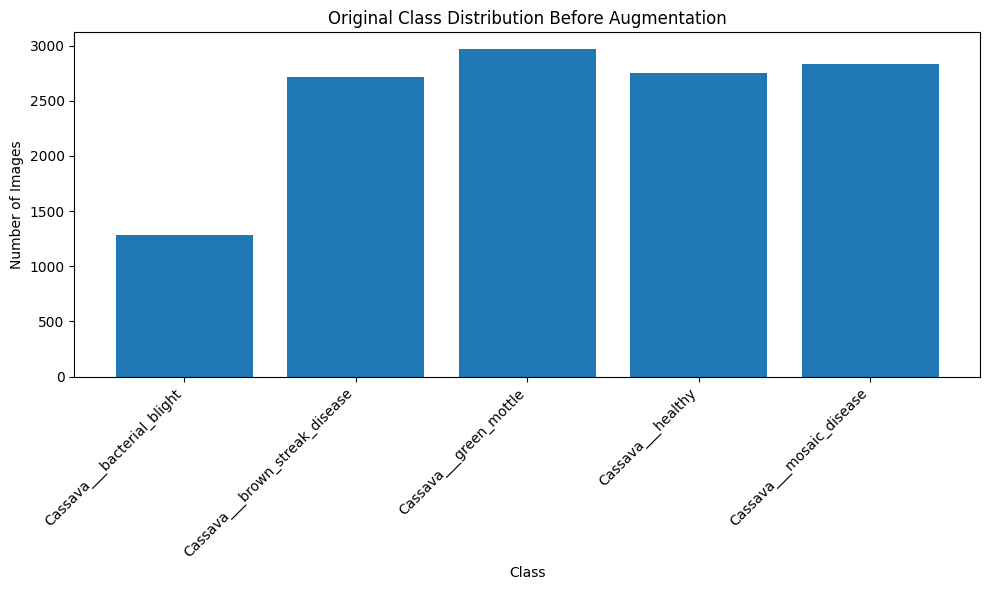

In [21]:
image_exts = (".jpg", ".jpeg", ".png", ".bmp", ".webp")

class_counts = {}

for class_name in sorted(os.listdir(train_dir)):
    class_path = os.path.join(train_dir, class_name)

    if os.path.isdir(class_path):
        count = len([
            file for file in os.listdir(class_path)
            if file.lower().endswith(image_exts)
        ])
        class_counts[class_name] = count

df_counts = pd.DataFrame(
    list(class_counts.items()),
    columns=["Class", "Image_Count"]
)

print(df_counts)

plt.figure(figsize=(10, 6))
plt.bar(df_counts["Class"], df_counts["Image_Count"])
plt.xlabel("Class")
plt.ylabel("Number of Images")
plt.title("Original Class Distribution Before Augmentation")
plt.xticks(rotation=45, ha="right")
plt.tight_layout()
plt.show()

In [22]:
classes = df_counts["Class"].values
counts = df_counts["Image_Count"].values

labels = []

for class_name, count in zip(classes, counts):
    labels.extend([class_name] * count)

labels = np.array(labels)

class_weight_values = compute_class_weight(
    class_weight="balanced",
    classes=np.unique(labels),
    y=labels
)

class_weights_by_name = {
    class_name: weight
    for class_name, weight in zip(np.unique(labels), class_weight_values)
}

df_counts["Class_Weight"] = df_counts["Class"].map(class_weights_by_name)

print(df_counts)

                            Class  Image_Count  Class_Weight
0      Cassava___bacterial_blight         1283      1.955729
1  Cassava___brown_streak_disease         2715      0.924199
2          Cassava___green_mottle         2971      0.844564
3               Cassava___healthy         2748      0.913100
4        Cassava___mosaic_disease         2829      0.886957


In [23]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

In [24]:
IMG_SIZE = 224
BATCH_SIZE = 32
NUM_CLASSES = 5

In [25]:
train_dir = "/content/cassava_plnt_disease_roboflow/train"
valid_dir = "/content/cassava_plnt_disease_roboflow/valid"
test_dir  = "/content/cassava_plnt_disease_roboflow/test"

In [26]:
train_ds = tf.keras.utils.image_dataset_from_directory(
    train_dir,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    label_mode="categorical",
    shuffle=True
)

valid_ds = tf.keras.utils.image_dataset_from_directory(
    valid_dir,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    label_mode="categorical",
    shuffle=False
)

test_ds = tf.keras.utils.image_dataset_from_directory(
    test_dir,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE,
    label_mode="categorical",
    shuffle=False
)

class_names = train_ds.class_names
print("Classes:", class_names)

Found 12546 files belonging to 5 classes.
Found 1448 files belonging to 5 classes.
Found 1930 files belonging to 5 classes.
Classes: ['Cassava___bacterial_blight', 'Cassava___brown_streak_disease', 'Cassava___green_mottle', 'Cassava___healthy', 'Cassava___mosaic_disease']


In [27]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.prefetch(AUTOTUNE)
valid_ds = valid_ds.prefetch(AUTOTUNE)
test_ds = test_ds.prefetch(AUTOTUNE)

data_augmentation = keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.08),
    layers.RandomZoom(0.10),
    layers.RandomContrast(0.10),
], name="data_augmentation")

In [28]:
base_model = tf.keras.applications.MobileNetV3Large(
    input_shape=(IMG_SIZE, IMG_SIZE, 3),
    include_top=False,
    weights="imagenet",
    include_preprocessing=True
)

base_model.trainable = False

12683000/12683000 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [29]:
inputs = keras.Input(shape=(IMG_SIZE, IMG_SIZE, 3))

x = data_augmentation(inputs)

x = base_model(x, training=False)

x = layers.GlobalAveragePooling2D()(x)

x = layers.BatchNormalization()(x)

x = layers.Dropout(0.35)(x)

x = layers.Dense(128, activation="relu")(x)

x = layers.Dropout(0.25)(x)

outputs = layers.Dense(NUM_CLASSES, activation="softmax")(x)

model = keras.Model(inputs, outputs, name="Cassava_MobileNetV3Large")

In [30]:
model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=1e-3),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

model.summary()

Model: "Cassava_MobileNetV3Large"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ data_augmentation (Sequential)  │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ MobileNetV3Large (Functional)   │ (None, 7, 7, 960)      │     2,996,352 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 960)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 960)            │         3,840 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 960)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │       123,008 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 5)              │           645 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,123,845 (11.92 MB)

 Trainable params: 125,573 (490.52 KB)

 Non-trainable params: 2,998,272 (11.44 MB)

In [31]:
callbacks = [
    keras.callbacks.ModelCheckpoint(
        "/content/best_cassava_mobilenetv3large.keras",
        monitor="val_accuracy",
        save_best_only=True,
        mode="max",
        verbose=1
    ),

    keras.callbacks.EarlyStopping(
        monitor="val_loss",
        patience=5,
        restore_best_weights=True,
        verbose=1
    ),

    keras.callbacks.ReduceLROnPlateau(
        monitor="val_loss",
        factor=0.3,
        patience=2,
        min_lr=1e-6,
        verbose=1
    )
]

In [32]:
class_weight = {
    0: 1.955729,
    1: 0.924199,
    2: 0.844564,
    3: 0.913100,
    4: 0.886957
}

In [33]:
history_stage1 = model.fit(
    train_ds,
    validation_data=valid_ds,
    epochs=10,
    callbacks=callbacks,
    class_weight=class_weight
)

Epoch 1/10
393/393 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - accuracy: 0.3893 - loss: 1.6948
Epoch 1: val_accuracy improved from None to 0.55041, saving model to /content/best_cassava_mobilenetv3large.keras

Epoch 1: finished saving model to /content/best_cassava_mobilenetv3large.keras
393/393 ━━━━━━━━━━━━━━━━━━━━ 51s 90ms/step - accuracy: 0.4505 - loss: 1.4859 - val_accuracy: 0.5504 - val_loss: 1.1481 - learning_rate: 0.0010
Epoch 2/10
392/393 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step - accuracy: 0.5112 - loss: 1.2227
Epoch 2: val_accuracy improved from 0.55041 to 0.56077, saving model to /content/best_cassava_mobilenetv3large.keras

Epoch 2: finished saving model to /content/best_cassava_mobilenetv3large.keras
393/393 ━━━━━━━━━━━━━━━━━━━━ 34s 86ms/step - accuracy: 0.5253 - loss: 1.1846 - val_accuracy: 0.5608 - val_loss: 1.1075 - learning_rate: 0.0010
Epoch 3/10
392/393 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step - accuracy: 0.5447 - loss: 1.1352
Epoch 3: val_accuracy improved from 0.56077 to 0.57942, saving

In [34]:
base_model.trainable = True

# Freeze most layers, train only last 40 layers
for layer in base_model.layers[:-40]:
    layer.trainable = False

# Keep BatchNormalization layers frozen for stable fine-tuning
for layer in base_model.layers:
    if isinstance(layer, layers.BatchNormalization):
        layer.trainable = False

model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=1e-5),
    loss="categorical_crossentropy",
    metrics=["accuracy"]
)

history_stage2 = model.fit(
    train_ds,
    validation_data=valid_ds,
    epochs=15,
    callbacks=callbacks,
    class_weight=class_weight
)

Epoch 1/15
393/393 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - accuracy: 0.5880 - loss: 1.0197
Epoch 1: val_accuracy improved from 0.59807 to 0.62155, saving model to /content/best_cassava_mobilenetv3large.keras

Epoch 1: finished saving model to /content/best_cassava_mobilenetv3large.keras
393/393 ━━━━━━━━━━━━━━━━━━━━ 48s 92ms/step - accuracy: 0.5987 - loss: 0.9903 - val_accuracy: 0.6215 - val_loss: 0.9747 - learning_rate: 1.0000e-05
Epoch 2/15
392/393 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step - accuracy: 0.6132 - loss: 0.9595
Epoch 2: val_accuracy did not improve from 0.62155
393/393 ━━━━━━━━━━━━━━━━━━━━ 38s 86ms/step - accuracy: 0.6254 - loss: 0.9424 - val_accuracy: 0.6209 - val_loss: 0.9682 - learning_rate: 1.0000e-05
Epoch 3/15
392/393 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step - accuracy: 0.6128 - loss: 0.9428
Epoch 3: val_accuracy did not improve from 0.62155
393/393 ━━━━━━━━━━━━━━━━━━━━ 36s 92ms/step - accuracy: 0.6259 - loss: 0.9307 - val_accuracy: 0.6188 - val_loss: 0.9617 - learning_rate: 1.0000e-05

In [35]:
test_loss, test_accuracy = model.evaluate(test_ds)

print("Test Loss:", test_loss)
print("Test Accuracy:", test_accuracy)

61/61 ━━━━━━━━━━━━━━━━━━━━ 5s 89ms/step - accuracy: 0.6601 - loss: 0.8597
Test Loss: 0.8597410321235657
Test Accuracy: 0.6601036190986633


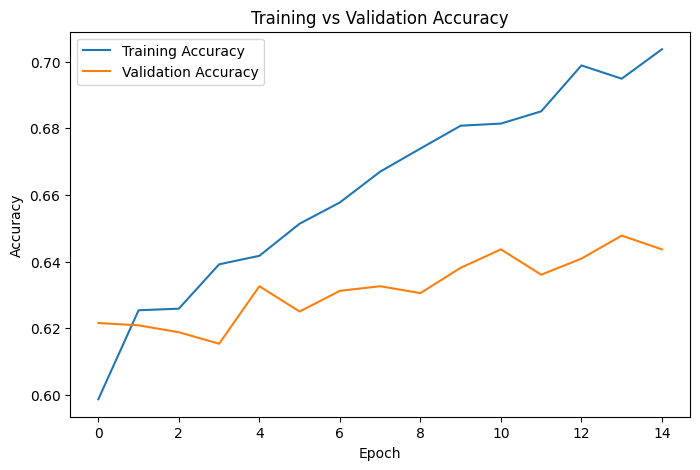

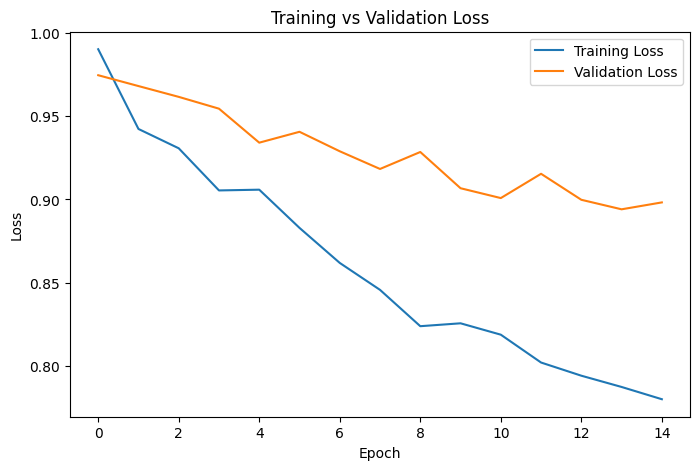

In [36]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 5))
plt.plot(history_stage2.history["accuracy"], label="Training Accuracy")
plt.plot(history_stage2.history["val_accuracy"], label="Validation Accuracy")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.title("Training vs Validation Accuracy")
plt.legend()
plt.show()

plt.figure(figsize=(8, 5))
plt.plot(history_stage2.history["loss"], label="Training Loss")
plt.plot(history_stage2.history["val_loss"], label="Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training vs Validation Loss")
plt.legend()
plt.show()

61/61 ━━━━━━━━━━━━━━━━━━━━ 7s 87ms/step
                                precision    recall  f1-score   support

    Cassava___bacterial_blight       0.46      0.67      0.55       196
Cassava___brown_streak_disease       0.69      0.57      0.62       418
        Cassava___green_mottle       0.76      0.65      0.70       457
             Cassava___healthy       0.55      0.67      0.61       423
      Cassava___mosaic_disease       0.81      0.74      0.78       436

                      accuracy                           0.66      1930
                     macro avg       0.66      0.66      0.65      1930
                  weighted avg       0.68      0.66      0.67      1930



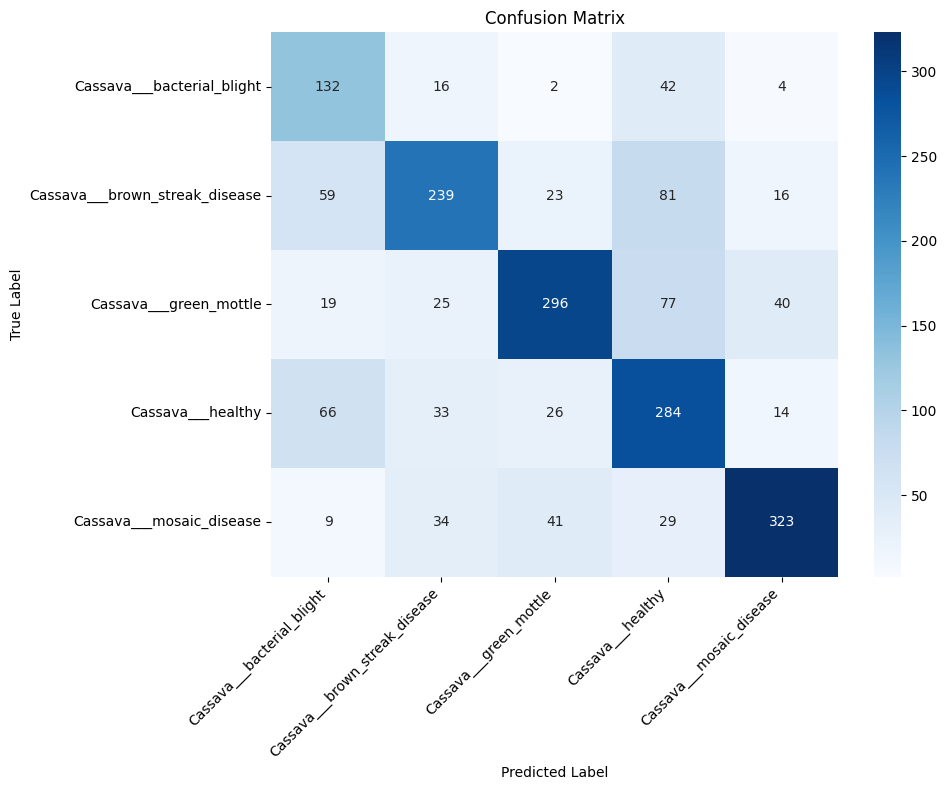

In [37]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.metrics import (
    classification_report,
    confusion_matrix
)

# Predict on test set
y_pred_probs = model.predict(test_ds)

y_pred = np.argmax(
    y_pred_probs,
    axis=1
)

# Extract true labels from test_ds
y_true = []
for _, labels in test_ds:
    y_true.extend(np.argmax(labels.numpy(), axis=1))
y_true = np.array(y_true)

# Use the already defined class_names variable
# class_names = test_ds.class_names

# Classification Report
print(
    classification_report(
        y_true,
        y_pred,
        target_names=class_names
    )
)

# Confusion Matrix
cm = confusion_matrix(
    y_true,
    y_pred
)

# Heatmap
plt.figure(figsize=(10, 8))

sns.heatmap(
    cm,
    annot=True,
    fmt="d",
    cmap="Blues",
    xticklabels=class_names,
    yticklabels=class_names
)

plt.title("Confusion Matrix")
plt.xlabel("Predicted Label")
plt.ylabel("True Label")

plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=0)

plt.tight_layout()
plt.show()

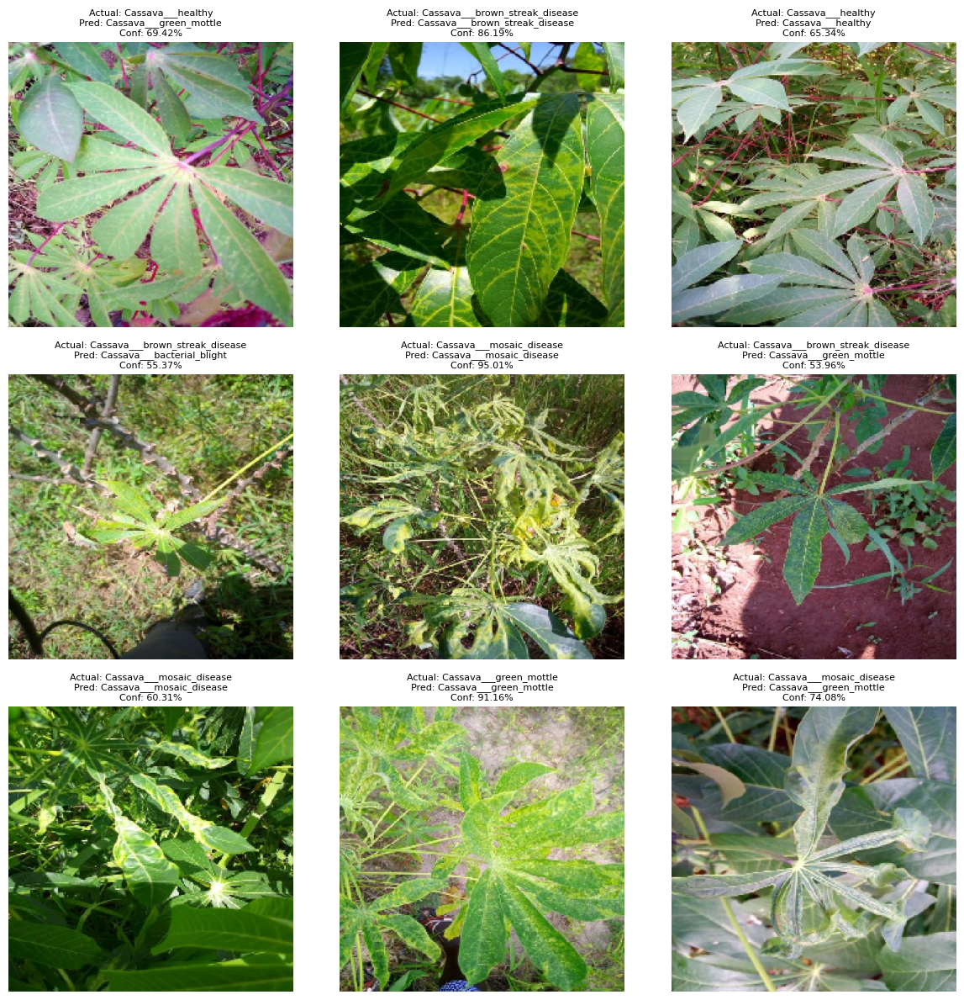

In [38]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image

# class_names is already defined in the notebook
# class_names = list(test_generator.class_indices.keys())

# Show 9 random test images
sample_df = test_df.sample(9)

fig, axes = plt.subplots(3, 3, figsize=(12, 12))

for ax, (_, row) in zip(axes.flatten(), sample_df.iterrows()):

    img_path = os.path.join(DATASET_PATH, row["image_path"])

    actual_label = row["disease"]

    # Load image
    img = image.load_img(
        img_path,
        target_size=(224, 224)
    )

    img_array = image.img_to_array(img)

    x = np.expand_dims(
        img_array,
        axis=0
    )

    # Preprocessing is handled by the model (include_preprocessing=True)
    # x = preprocess_input(x)

    # Prediction
    pred = model.predict(
        x,
        verbose=0
    )

    pred_idx = np.argmax(pred)

    predicted_label = class_names[pred_idx]

    confidence = np.max(pred) * 100

    # Plot
    ax.imshow(img)

    ax.set_title(
        f"Actual: {actual_label}\n"
        f"Pred: {predicted_label}\n"
        f"Conf: {confidence:.2f}%",
        fontsize=8
    )

    ax.axis("off")

plt.tight_layout()
plt.show()

In [39]:
import pandas as pd
import numpy as np
from tensorflow.keras.preprocessing import image

# Use the already defined class_names variable
# class_names = list(test_generator.class_indices.keys())

wrong_predictions = []
correct = 0
wrong = 0

for _, row in test_df.iterrows():

    img_path = os.path.join(DATASET_PATH, row["image_path"])
    actual_label = row["disease"]

    # Load image
    img = image.load_img(
        img_path,
        target_size=(224,224)
    )

    img_array = image.img_to_array(img)

    x = np.expand_dims(
        img_array,
        axis=0
    )

    # Preprocessing is handled by the model (include_preprocessing=True)
    # x = preprocess_input(x)

    pred = model.predict(
        x,
        verbose=0
    )

    pred_idx = np.argmax(pred)

    predicted_label = class_names[pred_idx]

    confidence = float(np.max(pred)) * 100

    if predicted_label == actual_label:
        correct += 1
    else:
        wrong += 1

        wrong_predictions.append({
            "actual_label": actual_label,
            "predicted_label": predicted_label,
            "confidence": confidence,
            "image_path": img_path
        })

# Create dataframe
wrong_df = pd.DataFrame(wrong_predictions)

print("="*50)
print("Total Images :", len(test_df))
print("Correct      :", correct)
print("Wrong        :", wrong)
print("Accuracy     :", round(correct/len(test_df)*100,2), "%")
print("="*50)

print("\nWrong Predictions:")
print(wrong_df.head(20))

Total Images : 1930
Correct      : 1262
Wrong        : 668
Accuracy     : 65.39 %

Wrong Predictions:
                  actual_label                 predicted_label  confidence  \
0   Cassava___bacterial_blight               Cassava___healthy   73.452646   
1   Cassava___bacterial_blight               Cassava___healthy   59.749794   
2   Cassava___bacterial_blight  Cassava___brown_streak_disease   50.609285   
3   Cassava___bacterial_blight          Cassava___green_mottle   47.187033   
4   Cassava___bacterial_blight          Cassava___green_mottle   25.692821   
5   Cassava___bacterial_blight               Cassava___healthy   44.172919   
6   Cassava___bacterial_blight  Cassava___brown_streak_disease   31.902227   
7   Cassava___bacterial_blight        Cassava___mosaic_disease   37.067592   
8   Cassava___bacterial_blight  Cassava___brown_streak_disease   56.685328   
9   Cassava___bacterial_blight               Cassava___healthy   49.240521   
10  Cassava___bacterial_blight          

In [40]:
wrong_df.groupby(
    "actual_label"
).size().sort_values(
    ascending=False
)

,0
actual_label,
Cassava___healthy,182
Cassava___brown_streak_disease,177
Cassava___green_mottle,128
Cassava___mosaic_disease,122
Cassava___bacterial_blight,59


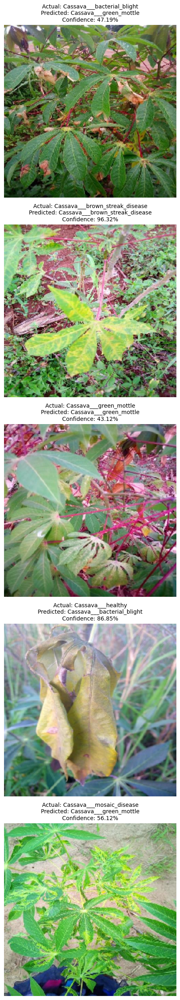

In [41]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
import os

# The correct column name is 'disease'
class_names_list = sorted(test_df["disease"].unique())

fig, axes = plt.subplots(
    len(class_names_list),
    1,
    figsize=(8, 5 * len(class_names_list))
)

if len(class_names_list) == 1:
    axes = [axes]

for ax, class_name in zip(axes, class_names_list):

    # Random image from this class
    row = test_df[
        test_df["disease"] == class_name
    ].sample(1).iloc[0]

    # Join path with DATASET_PATH to find the file
    img_path = os.path.join(DATASET_PATH, row["image_path"])

    # Load image
    img = image.load_img(
        img_path,
        target_size=(224,224)
    )

    img_array = image.img_to_array(img)

    x = np.expand_dims(
        img_array,
        axis=0
    )

    # Preprocessing is handled by the model (include_preprocessing=True)
    # x = preprocess_input(x)

    # Predict
    pred = model.predict(
        x,
        verbose=0
    )

    pred_idx = np.argmax(pred)

    # Use the existing class_names variable
    predicted_label = class_names[pred_idx]

    confidence = np.max(pred) * 100

    # Plot
    ax.imshow(img)

    ax.set_title(
        f"Actual: {class_name}\n"
        f"Predicted: {predicted_label}\n"
        f"Confidence: {confidence:.2f}%",
        fontsize=10
    )

    ax.axis("off")

plt.tight_layout()
plt.show()

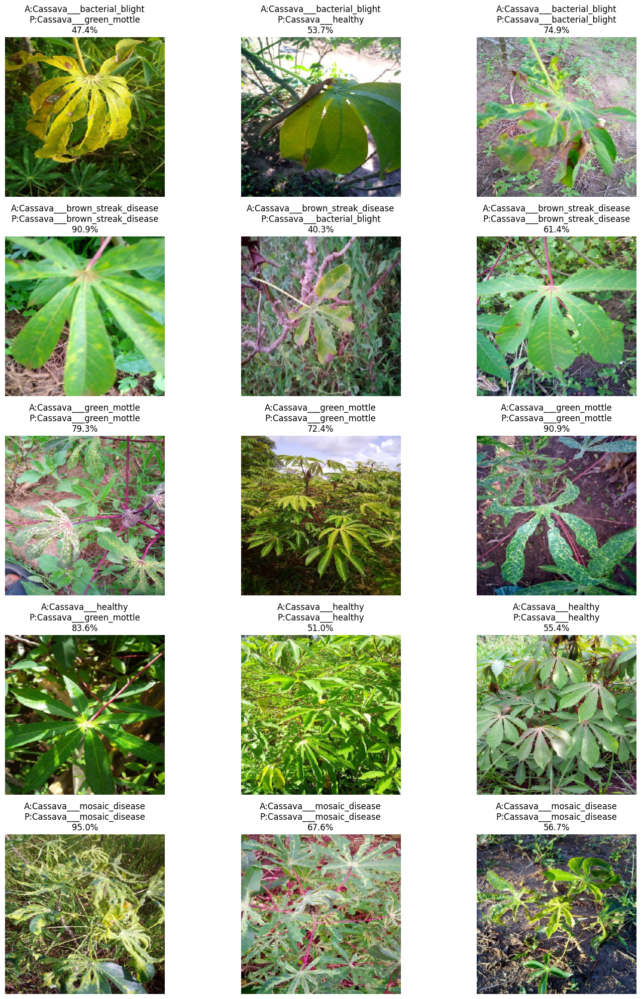

In [42]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
import os

# Correct column name is 'disease'
class_names_local = sorted(test_df["disease"].unique())

rows = len(class_names_local)
cols = 3

fig, axes = plt.subplots(
    rows,
    cols,
    figsize=(15, rows * 4)
)

for i, class_name in enumerate(class_names_local):
    # Filter test_df by 'disease' column
    samples = test_df[
        test_df["disease"] == class_name
    ].sample(3)

    for j, (_, row) in enumerate(samples.iterrows()):
        # Join with DATASET_PATH to get full path
        img_path = os.path.join(DATASET_PATH, row["image_path"])

        img = image.load_img(
            img_path,
            target_size=(224,224)
        )

        img_array = image.img_to_array(img)

        x = np.expand_dims(
            img_array,
            axis=0
        )

        # Preprocessing is handled by the model
        pred = model.predict(
            x,
            verbose=0
        )

        pred_idx = np.argmax(pred)

        # Use the class_names variable defined earlier in the notebook
        predicted = class_names[pred_idx]

        confidence = np.max(pred) * 100

        axes[i, j].imshow(img)

        axes[i, j].set_title(
            f"A:{class_name}\n"
            f"P:{predicted}\n"
            f"{confidence:.1f}%"
        )

        axes[i, j].axis("off")

plt.tight_layout()
plt.show()